<a href="https://www.kaggle.com/code/ahmednasser1601/object-detection-system?scriptVersionId=148130113" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
import os
import numpy as np
import tensorflow as tf
from seaborn import color_palette
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display

In [2]:
_BATCH_NORM_DECAY = 0.9
_BATCH_NORM_EPSILON = 1e-05
_LEAKY_RELU = 0.1
_MODEL_SIZE = (416, 416)
_ANCHORS = [
    (10, 13), (16, 30), (33, 23),
    (30, 61), (62, 45), (59, 119),
    (116, 90), (156, 198), (373, 326)
]

In [3]:
def batch_norm(inputs, training, data_format):
    return tf.layers.batch_normalization (
        inputs=inputs,
        axis=(1 if data_format == 'channels_first' else 3),
        momentum=_BATCH_NORM_DECAY,
        epsilon=_BATCH_NORM_EPSILON,
        scale=True,
        training=training,
    )

In [4]:
def fixed_padding(inputs, kernel_size, data_format):
    pad_total = kernel_size - 1
    pad_beg = pad_total // 2
    pad_end = pad_total - pad_beg
    padded_inputs = tf.pad(inputs, [[0, 0], [pad_beg, pad_end], [pad_beg, pad_end], [0, 0]])

    if data_format == 'channels_first':
        padded_inputs = tf.pad(inputs, [[0, 0], [0, 0], [pad_beg,  pad_end], [pad_beg, pad_end]])
    
    return padded_inputs

In [5]:
def conv2d_fixed_padding(inputs, filters, kernel_size, data_format, strides=1):
    if strides > 1:
        inputs = fixed_padding(inputs, kernel_size, data_format)

    return tf.layers.conv2d(
        inputs=inputs,
        filters=filters,
        kernel_size=kernel_size,
        strides=strides,
        padding=('SAME' if strides == 1 else 'VALID'),
        use_bias=False,
        data_format=data_format,
    )

In [6]:
def darknet53_residual_block(inputs, filters, training, data_format, strides=1):
    shortcut = inputs
    
    inputs = conv2d_fixed_padding(inputs, filters=filters, kernel_size=1, strides=strides, data_format=data_format)
    inputs = batch_norm(inputs, training=training, data_format=data_format)
    inputs = tf.nn.leaky_relu(inputs, alpha=_LEAKY_RELU)
    inputs = conv2d_fixed_padding(inputs, filters=2 * filters, kernel_size=3, strides=strides, data_format=data_format)
    inputs = batch_norm(inputs, training=training, data_format=data_format)
    inputs = tf.nn.leaky_relu(inputs, alpha=_LEAKY_RELU)
    inputs += shortcut
    
    return inputs

In [7]:
def darknet53(inputs, training, data_format):
    inputs = conv2d_fixed_padding(inputs, filters=32, kernel_size=3, data_format=data_format)
    inputs = batch_norm(inputs, training=training, data_format=data_format)
    inputs = tf.nn.leaky_relu(inputs, alpha=_LEAKY_RELU)
    inputs = conv2d_fixed_padding(inputs, filters=64, kernel_size=3, strides=2, data_format=data_format)
    inputs = batch_norm(inputs, training=training, data_format=data_format)
    inputs = tf.nn.leaky_relu(inputs, alpha=_LEAKY_RELU)
    inputs = darknet53_residual_block(inputs, filters=32, training=training, data_format=data_format)
    inputs = conv2d_fixed_padding(inputs, filters=128, kernel_size=3, strides=2, data_format=data_format)
    inputs = batch_norm(inputs, training=training, data_format=data_format)
    inputs = tf.nn.leaky_relu(inputs, alpha=_LEAKY_RELU)

    for _ in range(2):
        inputs = darknet53_residual_block(inputs, filters=64, training=training, data_format=data_format)

    inputs = conv2d_fixed_padding(inputs, filters=256, kernel_size=3, strides=2, data_format=data_format)
    inputs = batch_norm(inputs, training=training, data_format=data_format)
    inputs = tf.nn.leaky_relu(inputs, alpha=_LEAKY_RELU)

    for _ in range(8):
        inputs = darknet53_residual_block(inputs, filters=128, training=training, data_format=data_format)

    route1 = inputs
    
    inputs = conv2d_fixed_padding(inputs, filters=512, kernel_size=3, strides=2, data_format=data_format)
    inputs = batch_norm(inputs, training=training, data_format=data_format)
    inputs = tf.nn.leaky_relu(inputs, alpha=_LEAKY_RELU)
    
    for _ in range(8):
        inputs = darknet53_residual_block(inputs, filters=256, training=training, data_format=data_format)

    route2 = inputs

    inputs = conv2d_fixed_padding(inputs, filters=1024, kernel_size=3, strides=2, data_format=data_format)
    inputs = batch_norm(inputs, training=training, data_format=data_format)
    inputs = tf.nn.leaky_relu(inputs, alpha=_LEAKY_RELU)

    for _ in range(4):
        inputs = darknet53_residual_block(inputs, filters=512, training=training, data_format=data_format)

    return route1, route2, inputs

In [8]:
def yolo_convolution_block(inputs, filters, training, data_format):
    inputs = conv2d_fixed_padding(inputs, filters=filters, kernel_size=1, data_format=data_format)
    inputs = batch_norm(inputs, training=training, data_format=data_format)
    inputs = tf.nn.leaky_relu(inputs, alpha=_LEAKY_RELU)
    inputs = conv2d_fixed_padding(inputs, filters=2 * filters, kernel_size=3, data_format=data_format)
    inputs = batch_norm(inputs, training=training, data_format=data_format)
    inputs = tf.nn.leaky_relu(inputs, alpha=_LEAKY_RELU)
    inputs = conv2d_fixed_padding(inputs, filters=filters, kernel_size=1, data_format=data_format)
    inputs = batch_norm(inputs, training=training, data_format=data_format)
    inputs = tf.nn.leaky_relu(inputs, alpha=_LEAKY_RELU)
    inputs = conv2d_fixed_padding(inputs, filters=2 * filters, kernel_size=3, data_format=data_format)
    inputs = batch_norm(inputs, training=training, data_format=data_format)
    inputs = tf.nn.leaky_relu(inputs, alpha=_LEAKY_RELU)
    inputs = conv2d_fixed_padding(inputs, filters=filters, kernel_size=1, data_format=data_format)
    inputs = batch_norm(inputs, training=training, data_format=data_format)
    inputs = tf.nn.leaky_relu(inputs, alpha=_LEAKY_RELU)
    
    route = inputs
    
    inputs = conv2d_fixed_padding(inputs, filters=2 * filters, kernel_size=3, data_format=data_format)
    inputs = batch_norm(inputs, training=training, data_format=data_format)
    inputs = tf.nn.leaky_relu(inputs, alpha=_LEAKY_RELU)
    
    return route, inputs

In [9]:
def yolo_layer(inputs, n_classes, anchors, img_size, data_format):
    n_anchors = len(anchors)

    inputs = tf.layers.conv2d(
        inputs,
        filters=n_anchors * (5 + n_classes),
        kernel_size=1,
        strides=1,
        use_bias=True,
        data_format=data_format,
    )

    shape = inputs.get_shape().as_list()
    grid_shape = shape[2:4] if data_format=='channels_first' else shape[1:3]
    if data_format == 'channels_first':
        inputs = tf.transpose(inputs, [0, 2, 3, 1])
    inputs = tf.reshape(inputs, [-1, n_anchors * grid_shape[0] * grid_shape[1], 5 + n_classes])

    strides = (img_size[0] // grid_shape[0], img_size[1] // grid_shape[1])

    box_centers, box_shapes, confidence, classes = tf.split(inputs, [2, 2, 1, n_classes], axis=-1)

    x = tf.range(grid_shape[0], dtype=tf.float32)
    y = tf.range(grid_shape[1], dtype=tf.float32)
    
    x_offset, y_offset = tf.meshgrid(x, y)
    x_offset = tf.reshape(x_offset, (-1, 1))
    y_offset = tf.reshape(y_offset, (-1, 1))
    
    x_y_offset = tf.concat([x_offset, y_offset], axis=-1)
    x_y_offset = tf.tile(x_y_offset, [1, n_anchors])
    x_y_offset = tf.reshape(x_y_offset, [1, -1, 2])
    
    box_centers = tf.nn.sigmoid(box_centers)
    box_centers = (box_centers + x_y_offset) * strides

    anchors = tf.tile(anchors, [grid_shape[0] * grid_shape[1], 1])
    box_shapes = tf.exp(box_shapes) * tf.to_float(anchors)

    return tf.concat([box_centers, box_shapes, tf.nn.sigmoid(confidence), tf.nn.sigmoid(classes)], axis=-1)

In [10]:
def upsample(inputs, out_shape, data_format):
    if data_format == 'channels_first':
        inputs = tf.transpose(inputs, [0, 2, 3, 1])
        new_width, new_height = out_shape[2], out_shape[3]
    else:
        new_width, new_height = out_shape[1], out_shape[2]

    inputs = tf.image.resize_nearest_neighbor(inputs, (new_height, new_width))

    if data_format == 'channels_first':
        inputs = tf.transpose(inputs, [0, 3, 1, 2])

    return inputs

In [11]:
def build_boxes(inputs):
    center_x, center_y, width, height, confidence, classes = tf.split(inputs, [1, 1, 1, 1, 1, -1,], axis=-1)
    
    top_left_x = center_x - width / 2
    top_left_y = center_y - height / 2
    bottom_right_x = center_x + width / 2
    bottom_right_y = center_y + height / 2

    return tf.concat([top_left_x, top_left_y, bottom_right_x, bottom_right_y, confidence, classes], axis=-1)

In [12]:
def non_max_suppression(inputs, n_classes, max_output_size, iou_threshold, confidence_threshold):
    batch = tf.unstack(inputs)
    boxes_dicts = []
    
    for boxes in batch:
        boxes = tf.boolean_mask(boxes, boxes[:, 4] > confidence_threshold)
        classes = tf.argmax(boxes[:, 5:], axis=-1)
        classes = tf.expand_dims(tf.to_float(classes), axis=-1)
        boxes = tf.concat([boxes[:, :5], classes], axis=-1)

        boxes_dict = dict()
        
        for cls in range(n_classes):
            mask = tf.equal(boxes[:, 5], cls)
            mask_shape = mask.get_shape()
            if mask_shape.ndims != 0:
                class_boxes = tf.boolean_mask(boxes, mask)
                boxes_coords, boxes_conf_scores, _ = tf.split(class_boxes, [4, 1, -1], axis=-1)
                boxes_conf_scores = tf.reshape(boxes_conf_scores, [-1])
                indices = tf.image.non_max_suppression(boxes_coords, boxes_conf_scores, max_output_size, iou_threshold)
                class_boxes = tf.gather(class_boxes, indices)
                boxes_dict[cls] = class_boxes[:, :5]
        
        boxes_dicts.append(boxes_dict)
    return boxes_dicts

In [13]:
class Yolo_v3:
    def __init__(self, n_classes, model_size, max_output_size, iou_threshold, confidence_threshold, data_format=None):
        if not data_format:
            data_format = 'channels_first' if tf.test.is_built_with_cuda() else 'channels_last'

        self.n_classes = n_classes
        self.model_size = model_size
        self.max_output_size = max_output_size
        self.iou_threshold = iou_threshold
        self.confidence_threshold = confidence_threshold
        self.data_format = data_format

    def __call__(self, inputs, training):
        with tf.variable_scope('yolo_v3_model'):
            if self.data_format == 'channels_first':
                inputs = tf.transpose(inputs, [0, 3, 1, 2])

            inputs /= 255

            route1, route2, inputs = darknet53(inputs, training=training, data_format=self.data_format)

            route, inputs = yolo_convolution_block(inputs, filters=512, training=training, data_format=self.data_format)
            detect1 = yolo_layer(inputs, n_classes=self.n_classes, anchors=_ANCHORS[6:9], img_size=self.model_size, data_format=self.data_format)

            inputs = conv2d_fixed_padding(route, filters=256, kernel_size=1, data_format=self.data_format)
            inputs = batch_norm(inputs, training=training, data_format=self.data_format)
            inputs = tf.nn.leaky_relu(inputs, alpha=_LEAKY_RELU)
            upsample_size = route2.get_shape().as_list()
            inputs = upsample(inputs, out_shape=upsample_size, data_format=self.data_format)
            axis = 1 if self.data_format=='channels_first' else 3
            inputs = tf.concat([inputs, route2], axis=axis)
            route, inputs = yolo_convolution_block(inputs, filters=256, training=training, data_format=self.data_format)
            detect2 = yolo_layer(inputs, n_classes=self.n_classes, anchors=_ANCHORS[3:6], img_size=self.model_size, data_format=self.data_format)

            inputs = conv2d_fixed_padding(route, filters=128, kernel_size=1, data_format=self.data_format)
            inputs = batch_norm(inputs, training=training, data_format=self.data_format)
            inputs = tf.nn.leaky_relu(inputs, alpha=_LEAKY_RELU)
            upsample_size = route1.get_shape().as_list()
            inputs = upsample(inputs, out_shape=upsample_size, data_format=self.data_format)
            inputs = tf.concat([inputs, route1], axis=axis)
            route, inputs = yolo_convolution_block(inputs, filters=128, training=training, data_format=self.data_format)
            detect3 = yolo_layer(inputs, n_classes=self.n_classes, anchors=_ANCHORS[0:3], img_size=self.model_size, data_format=self.data_format)
            
            return non_max_suppression(
                build_boxes(tf.concat([detect1, detect2, detect3], axis=1)),
                n_classes=self.n_classes,
                max_output_size=self.max_output_size,
                iou_threshold=self.iou_threshold,
                confidence_threshold=self.confidence_threshold
            )

In [14]:
def load_images(imgNames, model_size):
    imgs = []

    for img_name in imgNames:
        img = Image.open(img_name)
        img = img.resize(size=model_size)
        img = np.array(img, dtype=np.float32)
        imgs.append(np.expand_dims(img, axis=0))

    return np.concatenate(imgs)

In [15]:
def load_class_names(file_name):
    with open(file_name, 'r') as f:
        class_names = f.read().splitlines()
    return class_names

In [16]:
def draw_boxes(imgNames, boxes_dicts, class_names, model_size):
    colors = (np.array(color_palette('hls', 80)) * 255).astype(np.uint8)
    for (num, img_name, boxes_dict) in zip(range(len(imgNames)), imgNames, boxes_dicts):
        img = Image.open(img_name)
        draw = ImageDraw.Draw(img)
        font = ImageFont.truetype(font='../input/data-for-yolo-v3-kernel/futur.ttf', size=(img.size[0] + img.size[1]) // 100)
        resize_factor = (img.size[0] / model_size[0], img.size[1] / model_size[1])
        
        for cls in range(len(class_names)):
            boxes = boxes_dict[cls]
            if np.size(boxes) != 0:
                color = colors[cls]
                for box in boxes:
                    xy, confidence = (box[:4], box[4])
                    xy = [xy[i] * resize_factor[i % 2] for i in range(4)]
                    x0, y0 = xy[0], xy[1]
                    thickness = (img.size[0] + img.size[1]) // 200
                    
                    for t in np.linspace(0, 1, thickness):
                        xy[0], xy[1] = xy[0] + t, xy[1] + t
                        xy[2], xy[3] = xy[2] - t, xy[3] - t
                        draw.rectangle(xy, outline=tuple(color))
                        
                    text = '{} {:.1f}%'.format(class_names[cls], confidence * 100)
                    text_size = draw.textsize(text, font=font)
                    draw.rectangle([x0, y0 - text_size[1], x0 + text_size[0], y0], fill=tuple(color))
                    draw.text((x0, y0 - text_size[1]), text, fill='black', font=font)

        display(img)

In [17]:
def load_weights(variables, file_name):
    with open(file_name, 'rb') as f:
        np.fromfile(f, dtype=np.int32, count=5)
        weights = np.fromfile(f, dtype=np.float32)

        assign_ops = []
        ptr = 0

        for i in range(52):
            conv_var = variables[5 * i]
            gamma, beta, mean, variance = variables[5 * i + 1:5 * i + 5]
            batch_norm_vars = [beta, gamma, mean, variance]

            for var in batch_norm_vars:
                shape = var.shape.as_list()
                num_params = np.prod(shape)
                var_weights = weights[ptr:ptr + num_params].reshape(shape)
                ptr += num_params
                assign_ops.append(tf.assign(var, var_weights))

            shape = conv_var.shape.as_list()
            num_params = np.prod(shape)
            var_weights = weights[ptr:ptr + num_params].reshape((shape[3], shape[2], shape[0], shape[1]))
            var_weights = np.transpose(var_weights, (2, 3, 1, 0))
            ptr += num_params
            assign_ops.append(tf.assign(conv_var, var_weights))

        ranges = [range(0, 6), range(6, 13), range(13, 20)]
        unnormalized = [6, 13, 20]

        for j in range(3):
            for i in ranges[j]:
                current = 52 * 5 + 5 * i + j * 2
                conv_var = variables[current]
                gamma, beta, mean, variance = variables[current+1:current+5]
                batch_norm_vars = [beta, gamma, mean, variance]

                for var in batch_norm_vars:
                    shape = var.shape.as_list()
                    num_params = np.prod(shape)
                    var_weights = weights[ptr:ptr + num_params].reshape(shape)
                    ptr += num_params
                    assign_ops.append(tf.assign(var, var_weights))

                shape = conv_var.shape.as_list()
                num_params = np.prod(shape)
                var_weights = weights[ptr:ptr + num_params].reshape((shape[3], shape[2], shape[0], shape[1]))
                var_weights = np.transpose(var_weights, (2, 3, 1, 0))
                ptr += num_params
                assign_ops.append(tf.assign(conv_var, var_weights))

            bias = variables[52*5 + unnormalized[j]*5 + j*2 + 1]
            shape = bias.shape.as_list()
            num_params = np.prod(shape)
            var_weights = weights[ptr:ptr + num_params].reshape(shape)
            ptr += num_params
            assign_ops.append(tf.assign(bias, var_weights))

            conv_var = variables[52*5 + unnormalized[j]*5 + j*2]
            shape = conv_var.shape.as_list()
            num_params = np.prod(shape)
            var_weights = weights[ptr:ptr + num_params].reshape((shape[3], shape[2], shape[0], shape[1]))
            var_weights = np.transpose(var_weights, (2, 3, 1, 0))
            ptr += num_params
            assign_ops.append(tf.assign(conv_var, var_weights))

    return assign_ops

In [18]:
class_names = load_class_names('/kaggle/input/data-for-yolo-v3-kernel/coco.names')
model = Yolo_v3(n_classes=len(class_names), model_size=_MODEL_SIZE, max_output_size=10, iou_threshold=0.5, confidence_threshold=0.5)

directory = '/kaggle/input/scenarios'
imgNames = [os.path.join(directory, filename) for filename in os.listdir(directory)]

inputs = tf.placeholder(tf.float32, [len(imgNames), 416, 416, 3])
detections = model(inputs, training=False)

model_vars = tf.global_variables(scope='yolo_v3_model')
assign_ops = load_weights(model_vars, '/kaggle/input/data-for-yolo-v3-kernel/yolov3.weights')

In [19]:
with tf.Session() as sess:
    sess.run(assign_ops)
    detection_result = sess.run(detections, feed_dict={inputs: load_images(imgNames, model_size=_MODEL_SIZE)})

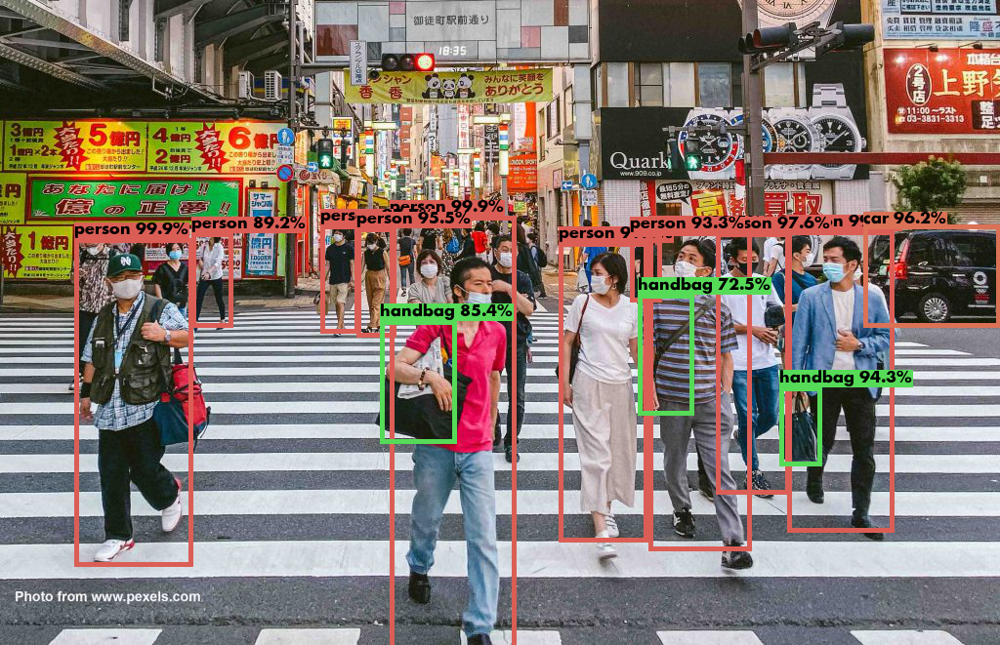

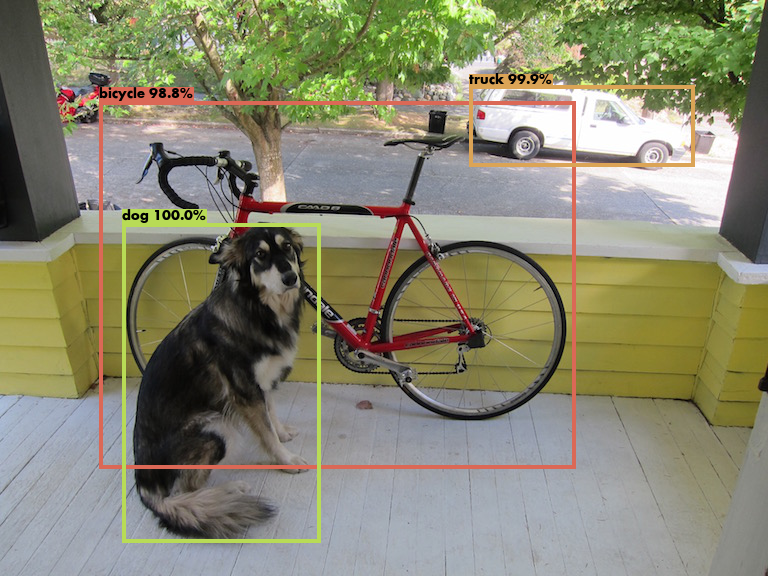

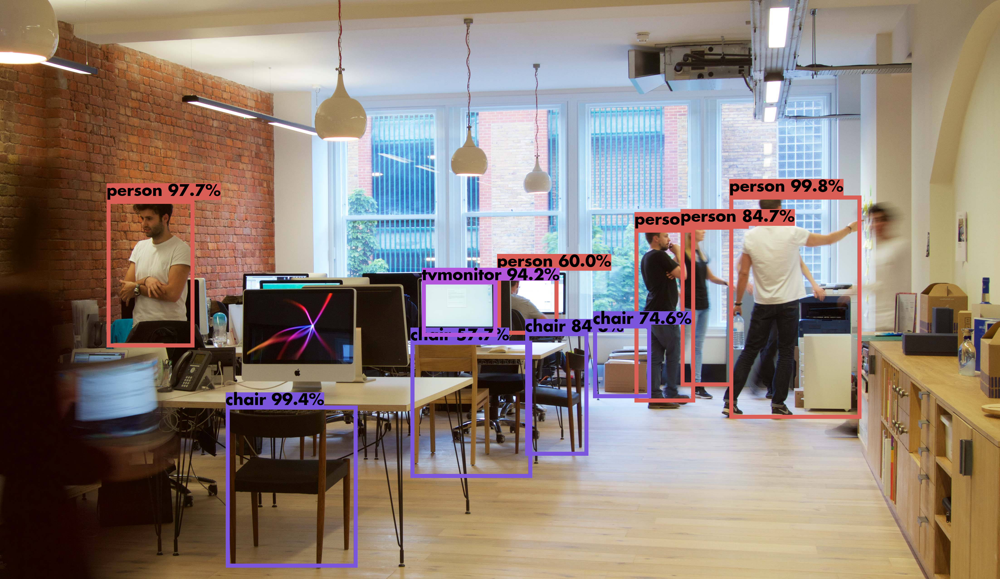

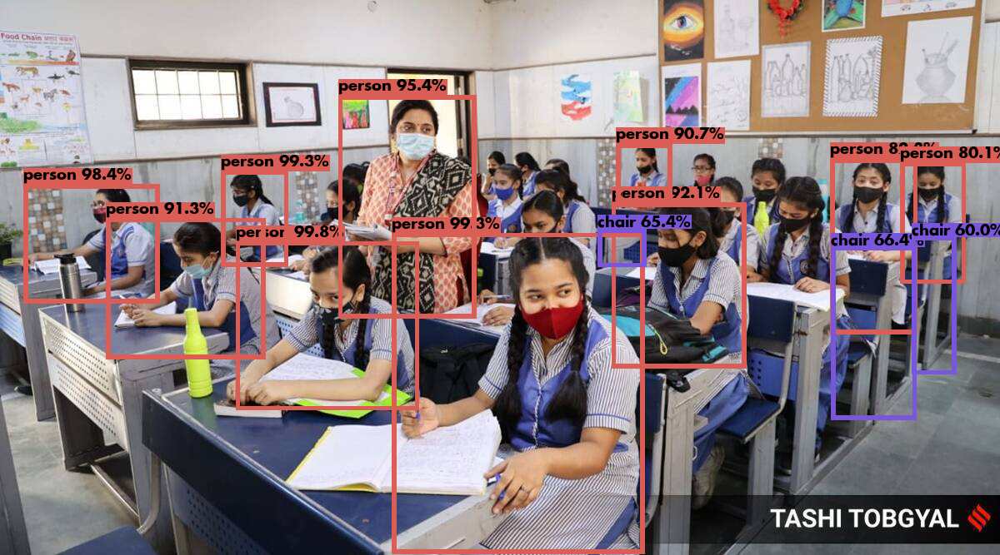

In [20]:
draw_boxes(imgNames, detection_result, class_names, _MODEL_SIZE)